### Дипломная работа по Feature engineering Татаренко Ларисы.

In [209]:
import pandas as pd
import numpy as np

In [210]:
data = pd.read_csv('taxi.csv')
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1


In [211]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
offer_gk                  100000 non-null int64
weekday_key               100000 non-null int64
hour_key                  100000 non-null int64
driver_gk                 100000 non-null int64
order_gk                  100000 non-null int64
driver_latitude           100000 non-null float64
driver_longitude          100000 non-null float64
origin_order_latitude     100000 non-null float64
origin_order_longitude    100000 non-null float64
distance_km               100000 non-null float64
duration_min              100000 non-null float64
offer_class_group         100000 non-null object
ride_type_desc            100000 non-null object
driver_response           100000 non-null int64
dtypes: float64(6), int64(6), object(2)
memory usage: 10.7+ MB


In [212]:
data['offer_class_group'].value_counts()

Economy     48335
Standard    47288
Premium      1773
Delivery     1290
Kids          588
XL            464
VIP           225
VIP+           29
Test            8
Name: offer_class_group, dtype: int64

In [213]:
data['ride_type_desc'].value_counts()

private      91207
business      8533
affiliate      224
SMB             36
Name: ride_type_desc, dtype: int64

In [214]:
data.describe()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,5.662189e+05,3.159860,13.827790,3446.376360,460867.01291,55.700824,37.492292,55.772440,37.541637,18.393518,23.134841,0.492480
std,3.259360e+05,2.054222,7.306496,2038.738677,266064.98953,2.135903,1.454640,0.665985,0.467758,41.129296,33.890105,0.499946
min,4.000000e+00,0.000000,0.000000,14.000000,18.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2.855552e+05,1.000000,8.000000,1421.000000,229178.50000,55.708651,37.413497,55.708032,37.407117,-1.000000,-1.000000,0.000000
50%,5.656715e+05,3.000000,16.000000,3506.500000,462420.00000,55.772904,37.533664,55.772561,37.532537,10.411500,19.700000,0.000000
75%,8.487198e+05,5.000000,20.000000,5242.000000,690894.00000,55.960667,37.624113,55.962000,37.624358,30.665250,37.867000,1.000000
max,1.130355e+06,6.000000,23.000000,6806.000000,920344.00000,56.174097,38.280547,56.311121,38.243608,5234.283000,3958.283000,1.000000


1. пропусков нет
2. есть два объекта тип object. Видов не много, я думаю, что эти категориальные переменные закодируем с помощью LabelEncoder
3.  не понятно, почему в weekday_key мак = 6 и есть 0 значение
4. driver_gk скорей всего не уникальные , надо посмотреть , что из этого можно получить
5. минусовые значения в нескольких колонках есть? Предполагаю, что это выбросы. distance_km и duration_min это явно результат вычислений  столбцов _latitude и _longitude , поэтому ошибки надо здесь искать.
6. 


### Проанализируем признаки  .

In [215]:
data[data['distance_km'] <=0]


# Многова-то 

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.0,-1.0,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.0,-1.0,Economy,private,1
6,103326,2,11,6080,615584,55.753508,37.663742,55.757251,37.659064,-1.0,-1.0,Standard,business,1
19,533917,5,8,6080,596531,55.913718,37.401395,55.921554,37.403505,-1.0,-1.0,Standard,business,0
21,123897,4,12,6080,185909,55.766763,37.607275,55.772388,37.606330,-1.0,-1.0,Standard,business,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99981,397745,1,23,2442,383092,55.961397,37.413560,55.962322,37.407117,-1.0,-1.0,Standard,private,0
99987,871592,4,23,2442,802677,55.961121,37.414019,55.961995,37.406355,-1.0,-1.0,Standard,private,0
99991,619039,6,23,2442,323136,55.961239,37.413497,55.962322,37.407117,-1.0,-1.0,Standard,private,0
99992,1021230,1,1,2442,351741,55.961301,37.413497,55.966694,37.415754,0.0,0.0,Standard,private,0


In [216]:
data[data['distance_km']== 1]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
47702,354727,0,17,4246,775545,55.668348,37.516480,55.667597,37.523161,1.0,5.833,Standard,private,1
90454,1057894,2,18,1857,564584,55.763754,37.557071,55.762561,37.571325,1.0,4.567,Economy,private,1


 *  Я думаю, что -1 это показатель маленького расстояния. Для корректности мы можем "-1" заменить на "1" , а "0" на "0.5"

In [217]:
data['distance_km'][data.distance_km <0] = 1

In [218]:
data['distance_km'][data.distance_km == 0] = 0.05 # учитывая дальнейший аналаиз, минимальное значение 0,005

In [219]:
data[data['distance_km']== 1].sample(7)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
40277,467231,5,23,1421,905118,55.961202,37.413297,55.961995,37.406355,1.0,-1.0,Economy,private,0
63806,924794,3,22,6258,791158,55.746150,37.537247,55.747215,37.539167,1.0,-1.0,Standard,business,1
39242,831463,2,3,1421,420655,55.961174,37.413282,55.961995,37.406355,1.0,-1.0,Standard,private,0
7499,182474,2,13,1186,754137,55.806363,37.721202,55.820186,37.701917,1.0,-1.0,Standard,private,1
3561,72161,0,20,6023,595992,55.752287,37.813211,55.750984,37.817686,1.0,-1.0,Economy,private,1
26140,982738,0,0,1793,725305,55.962122,37.409464,55.961553,37.404971,1.0,-1.0,Standard,private,0
6200,392273,2,17,2333,516230,55.765580,37.620612,55.759903,37.621754,1.0,-1.0,Standard,business,1


In [220]:
# аналогично сделаем и с duration_min
data['duration_min'][data.duration_min < 0] = 1
data['duration_min'][data.duration_min== 0] = 0.05

In [221]:
data['weekday_key'].value_counts()

5    19284
6    15466
0    14411
4    13290
1    13089
2    12859
3    11601
Name: weekday_key, dtype: int64

*  Как я понимаю, с нулевыми значениями не всегда корректный прогноз можно получить, я лучше 0 заменю на 7. 

In [222]:
data['weekday_key'][data.weekday_key ==0] = 7

In [223]:
data['driver_gk'].value_counts()

# немного! 

1421    3014
1060    2780
1126    2328
4490    1784
2442    1588
        ... 
2844      52
1978      52
689       52
854       51
3242      50
Name: driver_gk, Length: 439, dtype: int64

In [224]:
# data[data['driver_gk']== 3242]

In [225]:
# data[data['driver_gk']== 854]

* Пока не придумала, что с этим можно сделать.

In [226]:
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,1.000,1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,1.000,1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1


In [227]:
import pandas_profiling

In [228]:
data.profile_report()

задачи: 
1. Есть предупреждение о нулях в hour_key, заменю на 24 часа.
2. Высокая корреляция между distance_km  и duration_min , скорей всего лучше один объект оставить
3. Высока корреляция между широтой и долготой, у меня есть подозрения, что эти значения можно будет убрать.
4. offer_gk - думаю не представляет интерес для нас. Это просто номер заказа
5. order_gk - интересно, не каждый заказ выполняется с первого раза?! Значения не уникальны. Надо посмотреть почему
6. distance_km - есть значения меньше 0.05!  Может все под эту цифру? и есть максимальные значения, надо будет изучить на выбросы
7. Аналогичная ситуация с duration_min
8. Думаю в offer_class_group VIP and V+ объеденить, а Test убрать как выброс
9. ride_type_desc здесь объеденю SMB and affiliate. В начале надо, узнать что такое SMB. Хотя объединять надо с business
10. Есть количественные значения -11, категориальные -2 и булевые 1. Переводим в количественные


наблюдения : 
    - по  weekday_key больше всего заказов в пятницу, суббота и потом воскресенье.
    - hour_key больше заказов в вечернее время
    - есть в driver_gk отдельные "передовики" 1421, 1060, 1126!
    - есть наиболее "тусовочные места" у водителей судя по driver_latitude и driver_longitude
    - как в прочем и у клиентов. Видимо это центр города
    - distance_km - показазывает, что расстояние от такси до клиента не более 1 км в 27% 
    - если я правильно понимаю то значение 0 в driver_response означает не принят заказ, значит больше не принимают заказы - 50,8%
    - есть корреляция между категориальными признаками.

### Почистим наши признаки.

In [229]:
data.columns


Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'duration_min',
       'offer_class_group', 'ride_type_desc', 'driver_response'],
      dtype='object')

In [230]:
data['hour_key'][data.hour_key ==0] = 24

In [231]:
data['order_gk'].value_counts()


853342    14
714527    13
761031    13
828548    12
180487    12
          ..
529767     1
361705     1
57063      1
782999     1
786432     1
Name: order_gk, Length: 81435, dtype: int64

In [232]:
data[data['order_gk']== 853342]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
23218,929594,5,23,4339,853342,55.966694,37.415752,55.962322,37.407117,7.718,16.7,Economy,private,0
23484,574355,5,23,801,853342,55.961051,37.415866,55.962322,37.407117,7.718,16.7,Economy,private,0
23651,394516,5,23,2236,853342,55.962323,37.407117,55.962322,37.407117,7.718,16.7,Economy,private,0
24326,609443,5,23,4600,853342,55.962324,37.407116,55.962322,37.407117,7.718,16.7,Economy,private,0
24651,726807,5,23,4804,853342,55.960693,37.415349,55.962322,37.407117,7.718,16.7,Economy,private,0
24926,1066357,5,23,4100,853342,55.961092,37.413188,55.962322,37.407117,7.718,16.7,Economy,private,0
25672,338185,5,23,1793,853342,55.962122,37.409464,55.962322,37.407117,7.718,16.7,Economy,private,0
26857,882098,5,23,668,853342,55.962427,37.409279,55.962322,37.407117,7.718,16.7,Economy,private,0
27009,937263,5,23,2381,853342,55.961857,37.414049,55.962322,37.407117,7.718,16.7,Economy,private,0
27502,16487,5,23,1060,853342,55.961859,37.407126,55.962322,37.407117,7.718,16.7,Economy,private,0


In [233]:
len(data[data['order_gk']== 853342])

14

*Ну что я вижу, вечером в пятницу - самое пиковое время по предложениям, таксисты не хотят ехать за 7.7 км. Я понимаю, что это один заказ*

In [234]:
from matplotlib import pyplot as plt
import seaborn as sns

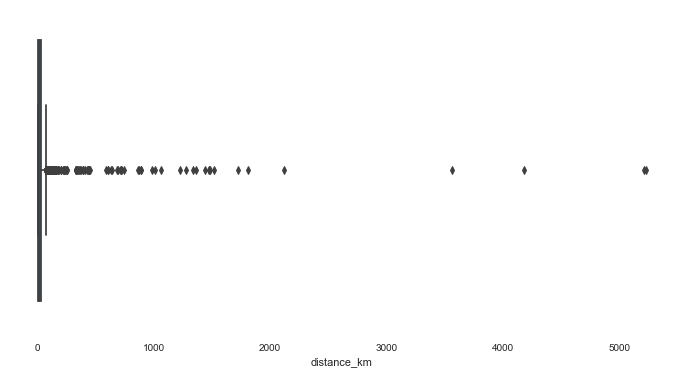

In [235]:
# Посмотрим на выбросы данный предикт
plt.figure(figsize=(12,6))
sns.boxplot(x=data['distance_km'])


In [236]:
len(data[data['distance_km']> 1900])

5

In [237]:
data = data.query('(distance_km < 1900 )')

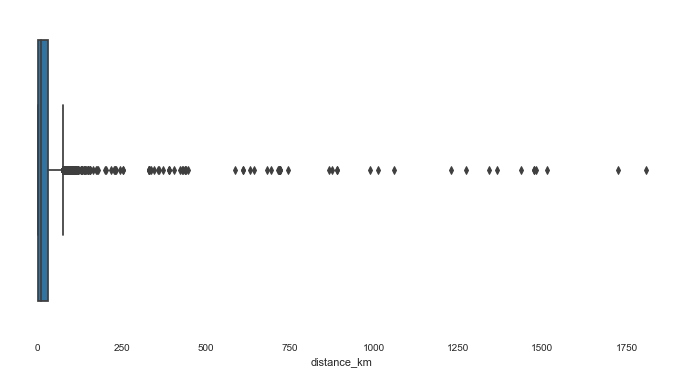

In [238]:
plt.figure(figsize=(12,6))
sns.boxplot(x=data['distance_km'])

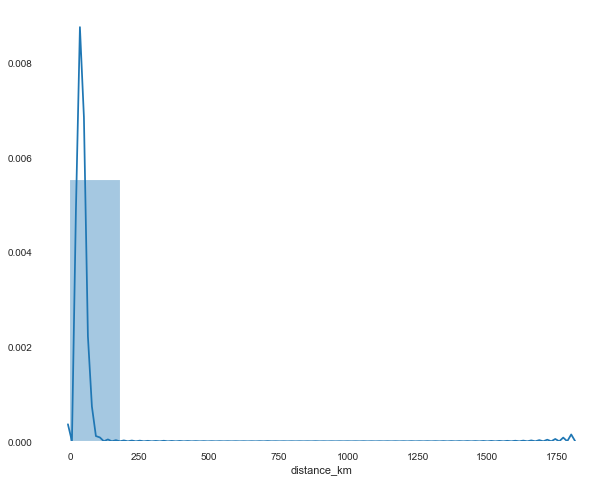

In [239]:
plt.figure(figsize=(10, 8))
sns.distplot(data['distance_km'], bins=10)

In [240]:
len(data[data['distance_km']> 500])

33

In [241]:
# Что это за такси за 500 км?! 
data[data['distance_km']> 500]

# Как может быть, чтобы таксист ехал на заказ 20 часов! Что-то мне кажется это уже не о такси. И даже за 250 км ! 

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
3794,301985,1,12,6486,118610,55.881154,37.652396,55.886504,37.662542,1274.213,920.383,Standard,private,1
6110,198416,4,17,2333,914494,55.733757,37.405701,55.734689,37.402236,1479.538,1014.283,Standard,private,0
9053,744607,3,21,5512,488974,55.414967,37.893330,55.410307,37.902451,609.334,495.817,Economy,private,0
10089,873470,1,16,6580,660752,55.831685,37.453510,55.827200,37.444590,1475.580,1149.667,Standard,private,0
12420,397655,6,23,5072,351317,55.777369,37.465752,55.779616,37.450302,987.373,704.783,Standard,private,1
13973,174541,1,20,5714,706021,55.808453,37.527302,55.809480,37.529113,1725.533,1254.050,Economy,private,1
14081,686617,5,18,3453,68743,55.734410,37.505964,55.734294,37.417933,719.433,537.750,Premium,private,1
14331,391059,6,15,2410,633727,55.602245,37.589453,55.592491,37.609445,1474.938,1159.000,XL,private,1
16195,300724,3,8,2337,552511,55.758244,37.595790,55.747323,37.629043,1228.398,908.683,VIP,private,1
17759,79366,6,21,6800,518346,55.868382,37.039287,55.886983,37.013210,875.719,713.317,Standard,private,0


In [242]:
len(data[data['distance_km']> 250])

58

 Я наберусь смелости и удалю эти значения из сета! 

In [243]:
data = data.query('(distance_km < 250 )')

In [244]:
data[data['duration_min'] < 5]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,1.000,1.000,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,1.000,1.000,Economy,private,1
6,103326,2,11,6080,615584,55.753508,37.663742,55.757251,37.659064,1.000,1.000,Standard,business,1
7,128861,5,20,6080,254374,55.839318,37.248862,55.839134,37.304101,1.517,3.933,Economy,private,0
18,450240,5,20,6080,314443,55.835728,37.263767,55.839134,37.304101,1.517,3.933,Standard,private,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99981,397745,1,23,2442,383092,55.961397,37.413560,55.962322,37.407117,1.000,1.000,Standard,private,0
99987,871592,4,23,2442,802677,55.961121,37.414019,55.961995,37.406355,1.000,1.000,Standard,private,0
99991,619039,6,23,2442,323136,55.961239,37.413497,55.962322,37.407117,1.000,1.000,Standard,private,0
99992,1021230,1,1,2442,351741,55.961301,37.413497,55.966694,37.415754,0.050,0.050,Standard,private,0


* Здесь я рассуждаю так, наша задача о заказе такси, а это значит , что должно пройти какое-то время с момента заказа и подачи ( доехать). Ту часть сета, что мы видим выше , это говорит об удачном месте расположении такси- клиент вышел и вот такси. 
Я все же должна сделать прогноз возмет заказ или нет водитель. Я удаляю эти значения. 

In [245]:
data = data.query('(duration_min  > 5)')

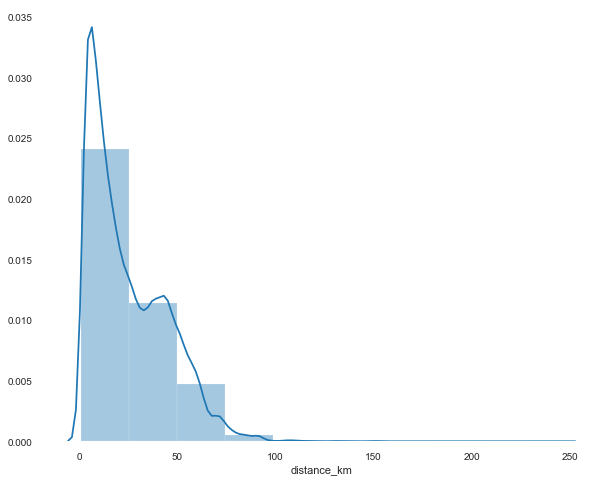

In [246]:
plt.figure(figsize=(10, 8))
sns.distplot(data['distance_km'], bins=10)

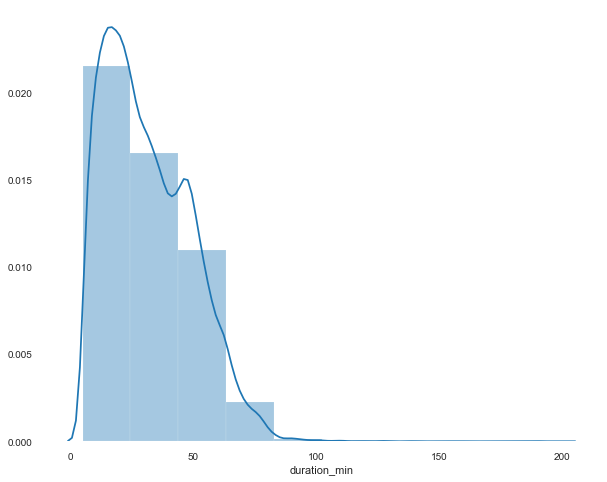

In [247]:
plt.figure(figsize=(10, 8))
sns.distplot(data['duration_min'], bins=10)

In [248]:
#Уберу и хвост больше 100 км
data = data.query('(distance_km  < 100)')

In [249]:
data.shape

(72345, 14)

In [250]:
# Две переменных имеют высокую корреляцию, одну из них удаляю
data = data.drop(['duration_min'], axis=1)

### Пришло время подумать о дополнительных признаках:
    - есть понимание, что в центре вероятность, что ваш заказ будет принят -  очень высокая. Есть такие координаты которые выделяются по повторам. 
    - Есть активные водители 
    - есть заказы, которые долго не принимаются

In [251]:
data.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'offer_class_group',
       'ride_type_desc', 'driver_response'],
      dtype='object')

In [252]:
data['driver_gk'].value_counts()

1421    2373
1060    2206
1126    1579
4490    1399
2442    1306
        ... 
3833      32
1316      32
6405      30
5909      29
5955      25
Name: driver_gk, Length: 439, dtype: int64

In [253]:
len(data[(data['driver_gk']==1421 ) & (data['driver_response']==1)])


86

In [254]:
len(data[(data['driver_gk']==1421 ) & (data['driver_response']==0)])

# он конечно же активный, но результата от него мало! Заказы почти не берет.

2287

In [255]:
data[(data['driver_gk']==1421 ) & (data['driver_response']==0)].head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,offer_class_group,ride_type_desc,driver_response
38458,138107,7,22,1421,416875,55.961171,37.413284,55.962322,37.407117,38.924,Standard,private,0
38460,150351,3,20,1421,722503,55.961180,37.413284,55.962322,37.407117,46.213,Standard,private,0
38461,718465,4,23,1421,204603,55.960937,37.413274,55.962322,37.407117,22.940,Standard,private,0
38462,306390,1,19,1421,343078,55.961174,37.413284,55.962322,37.407117,18.934,Standard,private,0
38463,489218,6,21,1421,666101,55.961172,37.413282,55.962322,37.407117,43.520,Standard,private,0


Создадим новый признак = 1, если принятых заказов у водителя больше , чем не принятых. =0 если наоборот

In [256]:
data['driver_eff'] = 0

In [257]:

def eff (data):
    l = len(data)
    while  l > 0:
        l=l-1
        val = data['driver_gk'][l]
        x = len(data[(data['driver_gk']==val ) & (data['driver_response']==1)])
        y = len(data[(data['driver_gk']==val ) & (data['driver_response']==0)])
        if (x -y) > 0:
            data['driver_eff'][l] = 1
        else:
            data['driver_eff'][l] = 0
     

In [258]:
data = data.reset_index(drop=True)

In [259]:
eff(data)

In [260]:
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff
0,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,Standard,private,1,1
1,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,Economy,private,0,1
2,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,Economy,private,1,1
3,1058203,6,15,6080,360328,55.818963,37.361033,55.814827,37.354074,6.747,Economy,private,0,1
4,493006,5,20,6080,753429,55.818748,37.338240,55.835764,37.294710,6.222,Economy,private,0,1


In [261]:
#data[data['driver_gk']==1421]

In [265]:
data['driver_latitude'].value_counts()

55.961859    2099
55.962987    1236
55.962323    1085
55.964894     951
55.964893     918
             ... 
55.771112       1
55.503591       1
55.605027       1
55.772637       1
55.767374       1
Name: driver_latitude, Length: 42635, dtype: int64

-  Получается , если широта месторасположения  заказчика равна значению 55.962323; 55.961859; 55.962987 вероятность , что заказ будет принят высока, потому что количество такси достаточно большое. 
- Это можно сразу объеденить и со значениями долготы 37.407126; 37.407117; 37.413543;37.413468 

In [266]:
data['driver_longitude'].value_counts()

37.407126    2107
37.407117    1805
37.413543    1674
37.413468    1084
37.409464     812
             ... 
37.577210       1
37.686518       1
37.540593       1
37.885155       1
37.477833       1
Name: driver_longitude, Length: 44035, dtype: int64

In [306]:
def cent_1(val):
    if val in (55.962323, 55.961859, 55.962987):
        return 1
    else:
        return 0


In [307]:
def cent_2(val):
    if val in (37.407117, 37.413543, 37.413468):
        return 1
    else:
        return 0


In [313]:
data['center'] = data['driver_latitude'].apply(cent_1) + data['driver_longitude'].apply(cent_2)

In [314]:
data['center'].value_counts()

0    65375
1     4957
2     2013
Name: center, dtype: int64

In [329]:
data.sample(5)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff,center
26037,1066399,7,20,1944,529444,55.418851,37.894623,55.410307,37.902451,46.439,Standard,private,0,0,0
5707,968621,5,23,3507,315256,55.414804,37.899107,55.410307,37.902451,27.056,Economy,private,0,0,0
13062,35263,7,21,6800,807806,55.699406,37.345212,55.678027,37.285632,2.704,Standard,private,1,1,0
27827,755074,6,10,994,112564,55.775242,37.586740,55.766704,37.570537,16.467,Economy,private,1,1,0
35002,746401,6,23,3789,165757,55.745785,37.612437,55.778592,37.587878,6.150,XL,private,0,0,0


In [330]:
data['order_gk'].value_counts()
# Объеденю заказы по степени сложности 

853342    14
761031    13
714527    13
181958    12
828548    12
          ..
113246     1
119379     1
207436     1
856651     1
786432     1
Name: order_gk, Length: 58091, dtype: int64

In [343]:
counts = data.order_gk.value_counts()

In [344]:
counts

853342    14
761031    13
714527    13
181958    12
828548    12
          ..
113246     1
119379     1
207436     1
856651     1
786432     1
Name: order_gk, Length: 58091, dtype: int64

In [345]:
# вторая степень сложности 
second = counts[(counts >= 3) & (counts < 5) ].index

In [346]:
G = counts[(counts < 3)].index

In [347]:
# третья  степень сложности 
third = counts[(counts >= 5) & (counts < 10) ].index

In [348]:
# четвертая степень сложности 
fourth = counts[counts >= 10 ].index

In [349]:
#Проверила - все верно расложилось
len(fourth)+len(third)+len(second)-len(counts)+len(G)

0

In [350]:
def oder(val):
    if val in second:
        return 2
    elif val in third:
        return 3
    elif val in fourth:
        return 4
    else:
        return 1 
  

In [351]:
data['order'] = data['order_gk'].apply(oder)

In [352]:
data['order'].value_counts()
# Отлично

1    58493
2     7559
3     6011
4      282
Name: order, dtype: int64

In [353]:
data.sample(5)


,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff,center,order
65340,180815,6,22,4028,492424,55.746315,37.866852,55.743245,37.864365,8.293,Economy,private,1,1,0,1
48136,855244,1,7,2954,272906,55.878158,37.423666,55.890209,37.414608,4.677,Economy,private,0,1,0,1
9691,1086515,4,8,4791,277249,55.840569,37.535140,55.842119,37.538278,4.318,Economy,private,1,0,0,1
39365,1003408,5,6,3242,257367,55.812003,37.698647,55.799930,37.730591,59.320,Economy,private,1,1,0,1
32386,670661,5,21,14,849449,55.729995,37.464021,55.729057,37.473067,3.651,Standard,private,1,1,0,1


###  Я создала дополнительных три признака :
    - эффективность водителя - driver_eff
    - показатель "центр"- center
    - сложность заказа- order

### Поработаем с категориальными признаками. 

In [354]:
data['offer_class_group'].value_counts()

Economy     40067
Standard    29315
Premium       973
Delivery      882
Kids          561
XL            435
VIP           101
VIP+           11
Name: offer_class_group, dtype: int64

In [355]:
data['offer_class_group'][data.offer_class_group == 'VIP+'] = 'VIP'

In [356]:
data['ride_type_desc'].value_counts()

private     72168
business      158
SMB            19
Name: ride_type_desc, dtype: int64

In [357]:
data['ride_type_desc'][data.ride_type_desc == 'SMB'] = 'business'

* Две категориальные величины ride_type_desc и offer_class_group между ними есть сильная корреляция, но я оставлю эти два  признака, потому что они несут разную информацию. (Delivery, Kids мы не сможем понять по ride_type_desc. И обратно private какой класс)
* Количество категорий у каждого признака не много, поэтому можем выбрать LabelEncoder

In [358]:
from sklearn.preprocessing import LabelEncoder
labelEnc = LabelEncoder()

In [359]:
data['offer_class_group'] = labelEnc.fit_transform(data['offer_class_group'])

In [360]:
data['ride_type_desc'] = labelEnc.fit_transform(data['ride_type_desc'])

In [361]:
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff,center,order
0,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,4,1,1,1,0,1
1,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,1,1,0,1,0,1
2,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,1,1,1,1,0,1
3,1058203,6,15,6080,360328,55.818963,37.361033,55.814827,37.354074,6.747,1,1,0,1,0,1
4,493006,5,20,6080,753429,55.818748,37.338240,55.835764,37.294710,6.222,1,1,0,1,0,1


### Двигаемся дальше. Убираем менее информационные признаки или сильно коррелирующие.  
    - информация по широте и долготе водителя и клиента можно убрать, мы с ней уже поработали. 
    - offer_gk и order_gk нам уже не интересны.

In [362]:
data.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'offer_class_group',
       'ride_type_desc', 'driver_response', 'driver_eff', 'center', 'order'],
      dtype='object')

In [363]:
data = data.drop(['driver_latitude' , 'driver_longitude', 'origin_order_latitude', 'origin_order_longitude'], axis=1)

In [364]:
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff,center,order
0,759733,5,14,6080,358774,18.802,4,1,1,1,0,1
1,416977,6,14,6080,866260,6.747,1,1,0,1,0,1
2,1120055,4,16,6080,506710,12.383,1,1,1,1,0,1
3,1058203,6,15,6080,360328,6.747,1,1,0,1,0,1
4,493006,5,20,6080,753429,6.222,1,1,0,1,0,1


In [365]:
data = data.drop(['offer_gk', 'order_gk'], axis =1)

In [366]:
data.sample(7)

,weekday_key,hour_key,driver_gk,distance_km,offer_class_group,ride_type_desc,driver_response,driver_eff,center,order
34138,4,8,3959,52.815,4,1,0,0,0,1
25210,6,10,4946,16.630,4,1,1,0,0,1
42605,5,16,4087,19.151,4,1,0,1,0,1
62004,5,23,1414,37.313,1,1,1,1,0,1
61413,4,15,4363,12.313,0,1,0,1,0,1
59311,2,12,2470,7.080,1,1,1,1,0,1
25215,1,12,4946,10.607,4,1,1,0,0,1


### Посмотрим гипотезы по разным выборкам 

In [368]:
# рассмотрим разные гипотезы

driver_1 = data.query('driver_response== 1')['distance_km']
driver_0 = data.query('driver_response== 0')['distance_km']

In [369]:
from scipy.stats import ttest_ind

In [370]:
ttest_ind(driver_1, driver_0)[1]
# p-value равно 0. Среднее значение этих двух выборок различное. 
#  Получается, что количество заказов в зависимости от км принятых и нет  разное!

0.0

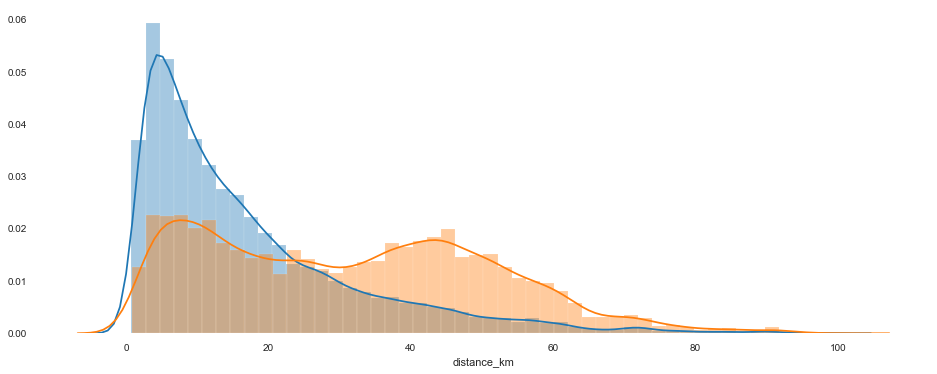

In [371]:
plt.figure(figsize=(16,6))
sns.distplot(driver_1)
sns.distplot(driver_0)

# Очень наглядно, что количество принятых заказов на близком расстояние значительно больше , чем отказ.
# И обратная картина, чем дальше расстояние "отказников" становиться больше чем те, кто приняли заказ.

In [372]:
driver_1 = data.query('driver_response== 1')['hour_key']
driver_0 = data.query('driver_response== 0')['hour_key']

In [373]:
ttest_ind(driver_1, driver_0)[1]
# p-value очень маленький. Среднее значение этих двух выборок различное. 
#  Получается, что количество заказов в зависимости от времени  принятых и нет  разное!

1.551831086514436e-97

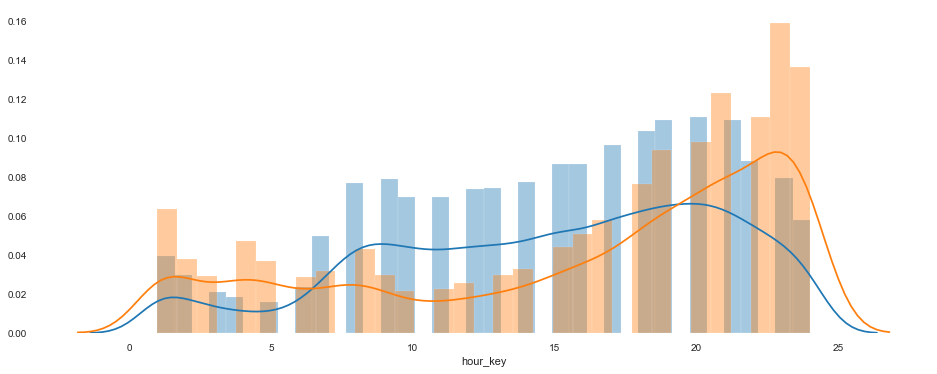

In [374]:
plt.figure(figsize=(16,6))
sns.distplot(driver_1)
sns.distplot(driver_0)

# Наглядно видим это различие

In [375]:
driver_1 = data.query('driver_response== 1')['weekday_key']
driver_0 = data.query('driver_response== 0')['weekday_key']

In [376]:
ttest_ind(driver_1, driver_0)[1]
# p-value очень маленький. Среднее значение этих двух выборок различное. 
#  Среднее значение принятых и нет заказов по дням недели разное 

2.0357394181552723e-12

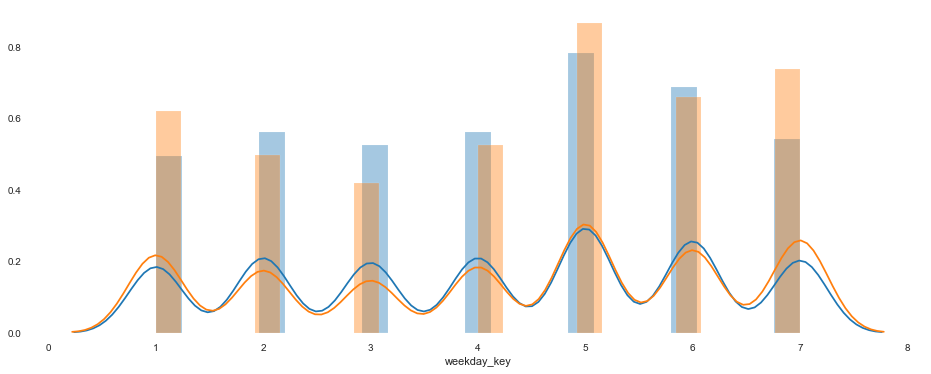

In [377]:
plt.figure(figsize=(16,6))
sns.distplot(driver_1)
sns.distplot(driver_0)

# В среду лучше не ездить на такси!! 

In [378]:
driver_1 = data.query('driver_response== 1')['offer_class_group']
driver_0 = data.query('driver_response== 0')['offer_class_group']

In [379]:
ttest_ind(driver_1, driver_0)[1]

1.0047241864049378e-43

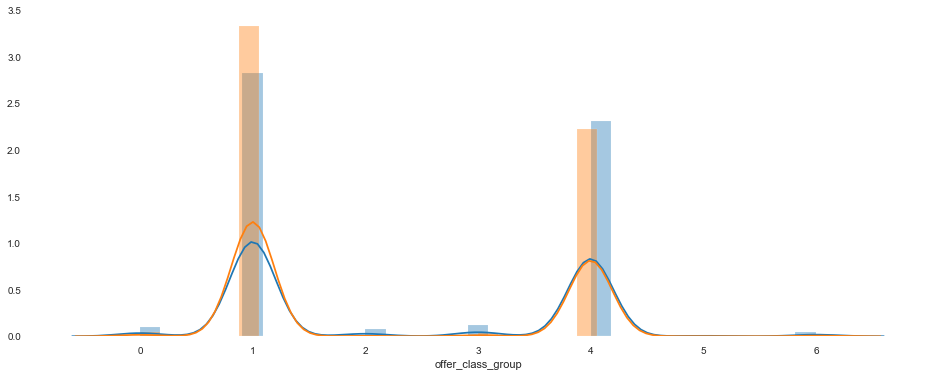

In [380]:
plt.figure(figsize=(16,6))
sns.distplot(driver_1)
sns.distplot(driver_0)


### Разделю выборку на обучаемую и тестовую. Буду использовать классификатор RandomForest .
Для этого классификатора признаки не обязательно нормализовывать. 

In [381]:
 # Колонка для прогнозирования 
target_col = ['driver_response']

In [382]:
# делим на признаки и таргетную переменную
X = data.drop(['driver_response'],axis=1)
y = data['driver_response']

In [383]:
from sklearn.model_selection import train_test_split

In [384]:
X_train, X_test, y_train , y_test = train_test_split(X,y, test_size =0.8)

In [385]:
from sklearn.ensemble import RandomForestRegressor

In [386]:
# Создаем модель деревья решений
# Выбираем 100 деревьев в качестве параметра
model=RandomForestRegressor(n_estimators=100)

In [387]:
# Обучаем модель
model.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

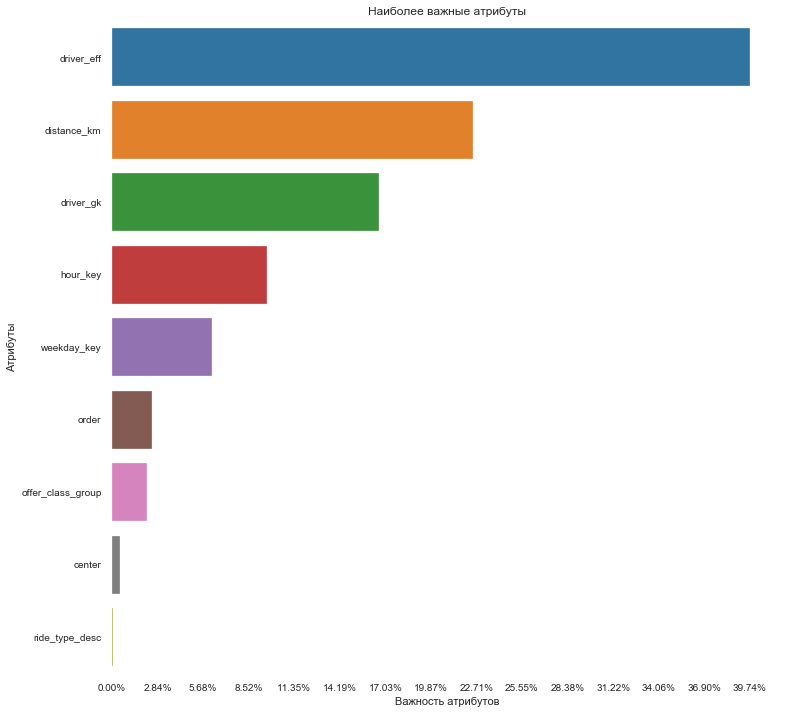

,0
driver_eff,0.397368
distance_km,0.225138
driver_gk,0.166446
hour_key,0.096576
weekday_key,0.062168
order,0.024817
offer_class_group,0.021993
center,0.004635
ride_type_desc,0.000859


In [388]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_, index=headers).sort_values(ascending=False)

f, ax =plt.subplots(figsize=(12,12))
sns.barplot(x=feature_imp, y=feature_imp.index)
x_ticks = np.linspace(start=0, stop=max(feature_imp), num = 15, endpoint = True)
plt.xticks(x_ticks,[f"{x:0.2%}" for x in x_ticks])
plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title('Наиболее важные атрибуты')

# ВАжность посмотрим на графике 
plt.show()

# Важность посмотрите в ДФ 
pd.DataFrame(feature_imp)

**Интересные приоритеты по признакам:**
    - Очень важно какому водителю попадет наша заявка- если "трудяга" приедет, а если разборчивый, то не факт
    - дистанция , конечно , от нее много зависит
    - driver_gk это все же аналог driver_eff
    - неожиданно для меня, что центр так мало имеет значение.

In [403]:
# Значения у из тестовой выборки
y_vals = pd.DataFrame({"driver_response":y_test})

# Предсказанные значения 
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by="driver_response", inplace=True)

y_vals.sample(15)

,driver_response,Prediction
852,1,0.84
4440,1,0.18
6797,1,0.97
61695,1,0.92
11399,1,0.94
21284,1,0.11
28504,0,0.01
6883,1,0.28
27654,1,0.57
55433,1,0.99


In [404]:
pred_test_y = model.predict(X_test)

In [405]:
import sklearn.metrics as metrics
from sklearn.metrics import mean_absolute_error

In [406]:
print(metrics.r2_score(y_test,pred_test_y))
print(mean_absolute_error(y_test,pred_test_y))

# Неплохой прогноз.

0.3627131158218935
0.2738494877389756


**Посмотрим прогноз без признака driver_gk**

In [407]:
# делим на признаки и таргетную переменную
X = data.drop(['driver_response', 'driver_gk'],axis=1)
y = data['driver_response']
X_train, X_test, y_train , y_test = train_test_split(X,y, test_size =0.8)
model=RandomForestRegressor(n_estimators=100)
model.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [408]:
headers = list(X_train.columns.values)
# Важность признаков
feature_imp = pd.Series(model.feature_importances_, index=headers).sort_values(ascending=False)
# Важность посмотрите в ДФ 
pd.DataFrame(feature_imp)

,0
driver_eff,0.393265
distance_km,0.367338
hour_key,0.114592
weekday_key,0.063524
order,0.027256
offer_class_group,0.024750
center,0.008048
ride_type_desc,0.001226


*важность признаков выросла* 

In [409]:
# Значения у из тестовой выборки
y_vals = pd.DataFrame({'driver_response':y_test})

# Предсказанные значения 
y_vals["Prediction"] = model.predict(X_test).tolist()
y_vals.sort_values(by='driver_response', inplace=True)

y_vals.sample(15)

,driver_response,Prediction
35376,0,0.250000
67747,0,0.120000
324,1,0.520000
3660,1,0.570000
36601,1,0.870000
26848,0,0.210000
63096,0,0.464667
51984,0,0.200000
49666,1,0.500000
51157,0,0.490000


In [410]:
pred_test_y = model.predict(X_test)

In [411]:
print(metrics.r2_score(y_test,pred_test_y))
print(mean_absolute_error(y_test,pred_test_y))

0.3699859306797144
0.2728701072188269


По-моему , получилось неплохое предсказание, со средней ошибкой 0.27. 